In [22]:
#import libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import datetime as dt
from statsmodels.tsa.seasonal import seasonal_decompose             # Time series components
from statsmodels.tsa.stattools import adfuller                      # To find the stationarity of the data
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf       # To plot ACF and PACF plots
from statsmodels.tsa.arima.model import ARIMA                       # To build the ARIMA model
from sklearn.metrics import mean_squared_error                      # To check the mean square error                                      
from statsmodels.tsa.statespace.sarimax import SARIMAX              # To build the sarimax model 
import statsmodels.api as sm                                 
import warnings
warnings.filterwarnings('ignore')

In [3]:
music=pd.read_csv("musical_instruments_data (2).csv")

In [4]:
music

,Unnamed: 0,asin,title,overall,brand,rank,verified,reviewerID,reviewerName,reviewTime,price,style,category,also_buy,also_view,main_cat,similar_item,Review,polarity,Sentiment
0,24539,B0002BFNO0,Bass Assassin Curly Shads,3,Bass Assassin,390192,False,A3NTFZS442MKPG,Mark,2014-08-18,5.74,2Inch Crystal Shad,"['Musical Instruments', 'Guitars']","['B005Z829YC', 'B0084EHLLK', 'B003ZZ81AS', 'B0...","['B008DR4XDM', 'B009M3TP3Y', 'B009A77KR0', 'B0...",Sports &amp; Outdoors,NaN,palstic grubsthree star,0.000000,Neutral
1,24541,B0002BFNO0,Bass Assassin Curly Shads,1,Bass Assassin,390192,True,A2II5RVB13J0M5,Ignacio Ruben Garibay,2014-06-18,5.74,2Inch Black Shad,"['Musical Instruments', 'Guitars']","['B005Z829YC', 'B0084EHLLK', 'B003ZZ81AS', 'B0...","['B008DR4XDM', 'B009M3TP3Y', 'B009A77KR0', 'B0...",Sports &amp; Outdoors,NaN,leave home star rating simply not work color l...,-0.183333,Negative
2,24543,B0002BFNO0,Bass Assassin Curly Shads,5,Bass Assassin,390192,True,AC29NDEY0MZQD,j harr1187,2014-04-01,5.74,2Inch Crystal Shad,"['Musical Instruments', 'Guitars']","['B005Z829YC', 'B0084EHLLK', 'B003ZZ81AS', 'B0...","['B008DR4XDM', 'B009M3TP3Y', 'B009A77KR0', 'B0...",Sports &amp; Outdoors,NaN,well soft bait catch killer crappie bass small...,0.150000,Positive
3,24545,B0002BFNO0,Bass Assassin Curly Shads,3,Bass Assassin,390192,True,A1YZIGL9TPCRD,THONG FANG,2013-05-28,5.74,2Inch Black Shad,"['Musical Instruments', 'Guitars']","['B005Z829YC', 'B0084EHLLK', 'B003ZZ81AS', 'B0...","['B008DR4XDM', 'B009M3TP3Y', 'B009A77KR0', 'B0...",Sports &amp; Outdoors,NaN,good catch crappie bass wiggly tail fishs atte...,0.062500,Positive
4,24547,B0002BFNO0,Bass Assassin Curly Shads,5,Bass Assassin,390192,True,A1UY5XOHNC97PY,Merryheart13,2018-03-06,5.74,2Inch Black Shad,"['Musical Instruments', 'Guitars']","['B005Z829YC', 'B0084EHLLK', 'B003ZZ81AS', 'B0...","['B008DR4XDM', 'B009M3TP3Y', 'B009A77KR0', 'B0...",Sports &amp; Outdoors,NaN,hubby love lake fish exactly describe happy pu...,0.520000,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4361,791347,B01EPSWMQC,"UNEXTATI iPhone 6 / iPhone 6s Case, Premium Wa...",1,UNEXTATI,181379,True,A2CXUEOQJ5WNVM,Phardy,2016-12-18,6.99,Purple,[],[],"['B07CY1S1YV', 'B076BNRCFS']",Musical Instruments,NaN,closure strap tore weekstrap tore,0.000000,Neutral
4362,791348,B01EPSWMQC,"UNEXTATI iPhone 6 / iPhone 6s Case, Premium Wa...",5,UNEXTATI,181379,True,A2XSBMDQ4U0YN9,Jacqueline Sanders,2016-07-29,6.99,Multicolor,[],[],"['B07CY1S1YV', 'B076BNRCFS']",Musical Instruments,NaN,nice like itfive star,0.600000,Positive
4363,791349,B01EPSWMQC,"UNEXTATI iPhone 6 / iPhone 6s Case, Premium Wa...",5,UNEXTATI,181379,True,A2M27CKARUOIA1,nikki sharma,2016-07-21,6.99,Multicolor,[],[],"['B07CY1S1YV', 'B076BNRCFS']",Musical Instruments,NaN,greatfive star,0.000000,Neutral
4364,791582,B01FDNR93O,"Band-in-a-Box 2016 Pro [Old Version, Mac DVD-ROM]",5,PG Music Inc.,6275,True,A1U1W0C7RSGT96,William Charles Janiak,2018-02-27,96.99,Format CDROM,"['Musical Instruments', 'Studio Recording Equi...",['0876391366'],"['B07D6SF2BM', 'B078PTGRM6']",Software,NaN,want product finally learn time thankswant lea...,0.000000,Neutral


In [5]:
music2 = music[["Sentiment","Review"]]
music2.groupby('Sentiment').describe()

Review                                                            \
           count unique                                                top   
Sentiment                                                                    
Negative     375    375  leave home star rating simply not work color l...   
Neutral      638    489                                      goodfive star   
Positive    3353   3285                                   love itfive star   

                
          freq  
Sentiment       
Negative     1  
Neutral     28  
Positive    16

In [7]:
music.shape

(4366, 20)

In [9]:
music.isnull().sum()

Unnamed: 0         0
asin               0
title              0
overall            0
brand              0
rank               0
verified           0
reviewerID         0
reviewerName       0
reviewTime         0
price             16
style              0
category           0
also_buy           0
also_view          0
main_cat           0
similar_item    1213
Review             0
polarity           0
Sentiment          0
dtype: int64

In [10]:
music.dropna(inplace=True) #deleting the null values

In [12]:
music.isnull().sum()

Unnamed: 0      0
asin            0
title           0
overall         0
brand           0
rank            0
verified        0
reviewerID      0
reviewerName    0
reviewTime      0
price           0
style           0
category        0
also_buy        0
also_view       0
main_cat        0
similar_item    0
Review          0
polarity        0
Sentiment       0
dtype: int64

# convert review time column to day time format

In [14]:
music['reviewTime'] = pd.to_datetime(music['reviewTime'])

In [15]:
music.dtypes

Unnamed: 0               int64
asin                    object
title                   object
overall                  int64
brand                   object
rank                     int64
verified                  bool
reviewerID              object
reviewerName            object
reviewTime      datetime64[ns]
price                  float64
style                   object
category                object
also_buy                object
also_view               object
main_cat                object
similar_item            object
Review                  object
polarity               float64
Sentiment               object
dtype: object

# sentiment forcasting

# sentiment forecasting using time series analysis can provide valuable insights into customer sentiment trends and help businesses make informed decisions to improve customer satisfaction and loyalty.

In [17]:
df=music.copy()
df.head(5)

,Unnamed: 0,asin,title,overall,brand,rank,verified,reviewerID,reviewerName,reviewTime,price,style,category,also_buy,also_view,main_cat,similar_item,Review,polarity,Sentiment
168,292216,B000NJ2TIE,Behringer Ultravoice XM1800S Dynamic Cardioid ...,3,Behringer,495,True,AQP1Z1ZYAYQ5B,Christopher W. Parrett,2018-04-09,7.99,Black,"['Musical Instruments', 'Microphones & Accesso...","['B00X7YJUGG', 'B01JNLUMMW', 'B00O5EL4MA', 'B0...",[],Musical Instruments,"class=""a-bordered a-horizontal-stripes a-spa...",not sure system not sound well cheap radio sha...,0.030000,Positive
169,292217,B000NJ2TIE,Behringer Ultravoice XM1800S Dynamic Cardioid ...,3,Behringer,495,True,ATNOW4ID9AXGS,FoxyNC,2018-03-25,7.99,Black,"['Musical Instruments', 'Microphones & Accesso...","['B00X7YJUGG', 'B01JNLUMMW', 'B00O5EL4MA', 'B0...",[],Musical Instruments,"class=""a-bordered a-horizontal-stripes a-spa...",mic fine mic holder cheap do not fit mic come ...,-0.022222,Negative
170,292218,B000NJ2TIE,Behringer Ultravoice XM1800S Dynamic Cardioid ...,4,Behringer,495,True,A2LJ0XC4FGTTH9,Kevin Davey,2018-03-23,7.99,Black,"['Musical Instruments', 'Microphones & Accesso...","['B00X7YJUGG', 'B01JNLUMMW', 'B00O5EL4MA', 'B0...",[],Musical Instruments,"class=""a-bordered a-horizontal-stripes a-spa...",buy mics refund got amazon complain have not f...,0.109598,Positive
171,292219,B000NJ2TIE,Behringer Ultravoice XM1800S Dynamic Cardioid ...,4,Behringer,495,True,A2O27ROXLHLJQB,Bobe,2018-03-22,7.99,Black,"['Musical Instruments', 'Microphones & Accesso...","['B00X7YJUGG', 'B01JNLUMMW', 'B00O5EL4MA', 'B0...",[],Musical Instruments,"class=""a-bordered a-horizontal-stripes a-spa...",great mike great sound sleek nicegreat sound m...,0.580000,Positive
172,292220,B000NJ2TIE,Behringer Ultravoice XM1800S Dynamic Cardioid ...,4,Behringer,495,True,A34N9XXB4M2WC,Carrie,2018-03-21,7.99,Black,"['Musical Instruments', 'Microphones & Accesso...","['B00X7YJUGG', 'B01JNLUMMW', 'B00O5EL4MA', 'B0...",[],Musical Instruments,"class=""a-bordered a-horizontal-stripes a-spa...",great product pricefour star,0.800000,Positive


In [18]:
# Setting the index as Date
df= df.set_index('reviewTime')
df.head()

,Unnamed: 0,asin,title,overall,brand,rank,verified,reviewerID,reviewerName,price,style,category,also_buy,also_view,main_cat,similar_item,Review,polarity,Sentiment
reviewTime,,,,,,,,,,,,,,,,,,,
2018-04-09,292216,B000NJ2TIE,Behringer Ultravoice XM1800S Dynamic Cardioid ...,3,Behringer,495,True,AQP1Z1ZYAYQ5B,Christopher W. Parrett,7.99,Black,"['Musical Instruments', 'Microphones & Accesso...","['B00X7YJUGG', 'B01JNLUMMW', 'B00O5EL4MA', 'B0...",[],Musical Instruments,"class=""a-bordered a-horizontal-stripes a-spa...",not sure system not sound well cheap radio sha...,0.030000,Positive
2018-03-25,292217,B000NJ2TIE,Behringer Ultravoice XM1800S Dynamic Cardioid ...,3,Behringer,495,True,ATNOW4ID9AXGS,FoxyNC,7.99,Black,"['Musical Instruments', 'Microphones & Accesso...","['B00X7YJUGG', 'B01JNLUMMW', 'B00O5EL4MA', 'B0...",[],Musical Instruments,"class=""a-bordered a-horizontal-stripes a-spa...",mic fine mic holder cheap do not fit mic come ...,-0.022222,Negative
2018-03-23,292218,B000NJ2TIE,Behringer Ultravoice XM1800S Dynamic Cardioid ...,4,Behringer,495,True,A2LJ0XC4FGTTH9,Kevin Davey,7.99,Black,"['Musical Instruments', 'Microphones & Accesso...","['B00X7YJUGG', 'B01JNLUMMW', 'B00O5EL4MA', 'B0...",[],Musical Instruments,"class=""a-bordered a-horizontal-stripes a-spa...",buy mics refund got amazon complain have not f...,0.109598,Positive
2018-03-22,292219,B000NJ2TIE,Behringer Ultravoice XM1800S Dynamic Cardioid ...,4,Behringer,495,True,A2O27ROXLHLJQB,Bobe,7.99,Black,"['Musical Instruments', 'Microphones & Accesso...","['B00X7YJUGG', 'B01JNLUMMW', 'B00O5EL4MA', 'B0...",[],Musical Instruments,"class=""a-bordered a-horizontal-stripes a-spa...",great mike great sound sleek nicegreat sound m...,0.580000,Positive
2018-03-21,292220,B000NJ2TIE,Behringer Ultravoice XM1800S Dynamic Cardioid ...,4,Behringer,495,True,A34N9XXB4M2WC,Carrie,7.99,Black,"['Musical Instruments', 'Microphones & Accesso...","['B00X7YJUGG', 'B01JNLUMMW', 'B00O5EL4MA', 'B0...",[],Musical Instruments,"class=""a-bordered a-horizontal-stripes a-spa...",great product pricefour star,0.800000,Positive


In [20]:
positive=df[(df['Sentiment']=='Positive')]
negative=df[(df['Sentiment']=='Negative')]
neutral=df[(df['Sentiment']=='Neutral')]

In [21]:
pos_df=positive[['polarity']]
pos_df

,polarity
reviewTime,
2018-04-09,0.030000
2018-03-23,0.109598
2018-03-22,0.580000
2018-03-21,0.800000
2018-03-12,0.525000
...,...
2016-08-04,0.600000
2015-10-25,0.700000
2015-06-21,0.220000


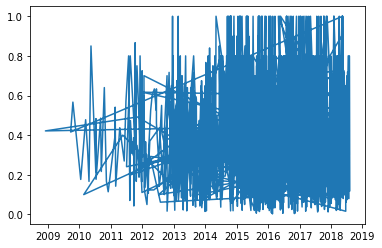

In [23]:
plt.plot(pos_df);

In [24]:
pos_df= pos_df.resample('MS').mean()
pos_df.isnull().sum()

polarity    14
dtype: int64

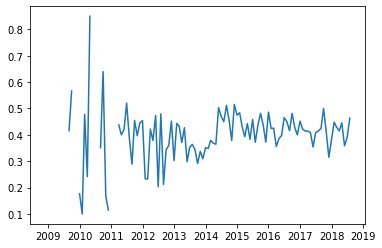

In [25]:
plt.plot(pos_df);

In [26]:
pos_df["polarity"] = pos_df["polarity"].interpolate(option="spline")

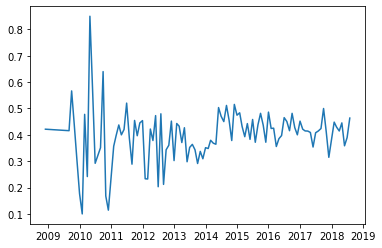

In [27]:
plt.plot(pos_df);

# checking stationary of data

In [31]:
def check_data(data):
    pvalue = adfuller(data)[1]
    print("pvalue",pvalue)
    if pvalue < 0.05:
        msg = "Data is stationary"
    else:
        msg = "Data is not stationary"
    return msg

In [32]:
check_data(pos_df)

pvalue 2.481881821223411e-15


'Data is stationary'

# datais stationary now we can proceed further

for non stationary data ,make it stationary
#for i in range(1,5):
    x = pos_df-pos_df.shift(i)
    x.dropna(inplace=True)
    msg = check_data(x)
    if msg == "Data is stationary":
        print("Shift value",i,msg)
        break

In [33]:
# Decomposition plot for predicted data using Features
decomposition_p=seasonal_decompose((pos_df), period=12)
trend=decomposition_p.trend
seasonal=decomposition_p.seasonal
residual=decomposition_p.resid

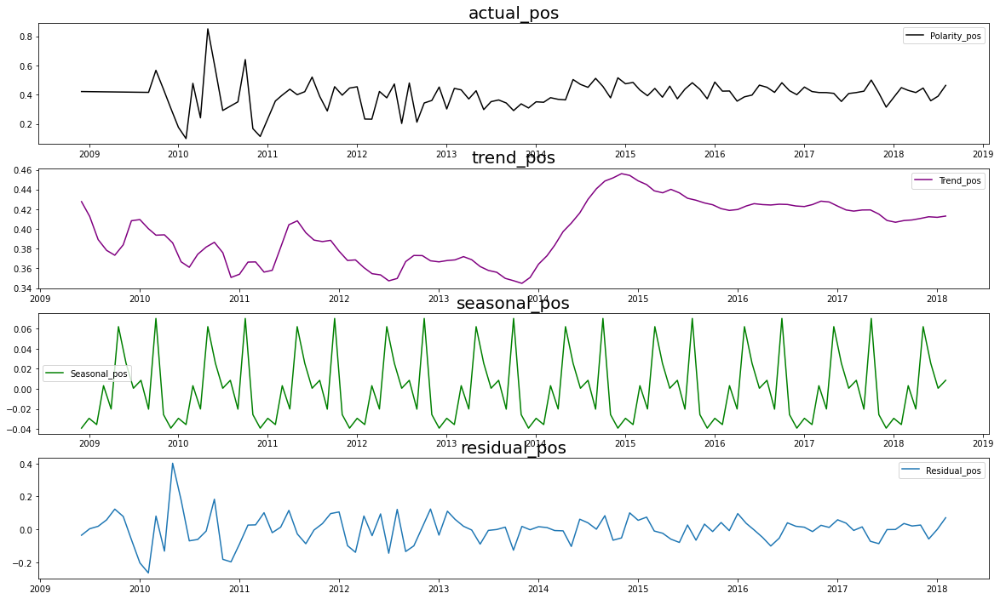

In [34]:
ig,ax = plt.subplots(4,1,figsize=(20,12))

plt.subplot(411)
plt.plot(pos_df,label='Polarity_pos',c='black')
plt.legend()
plt.title('actual_pos', fontsize = 20)

plt.subplot(412)
plt.plot(trend,label='Trend_pos',c='purple')
plt.legend()
plt.title('trend_pos', fontsize = 20)

plt.subplot(413)
plt.plot(seasonal,label='Seasonal_pos',c='green')
plt.legend()
plt.title('seasonal_pos', fontsize = 20)

plt.subplot(414)
plt.plot(residual,label='Residual_pos')
plt.legend()
plt.title('residual_pos', fontsize = 20)
plt.show()

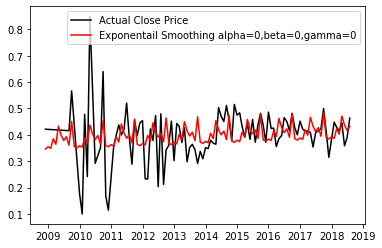

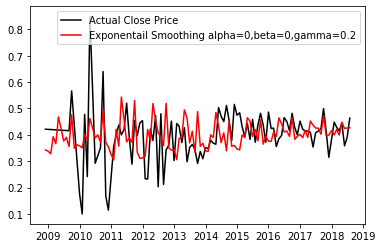

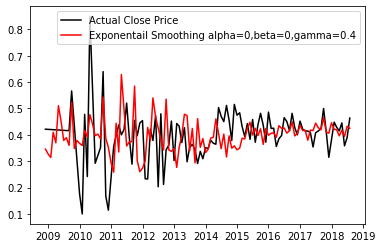

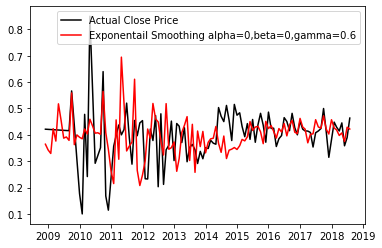

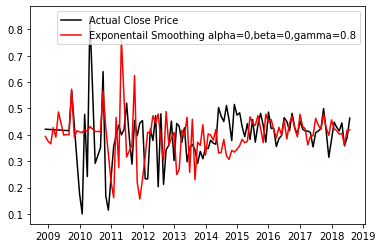

...

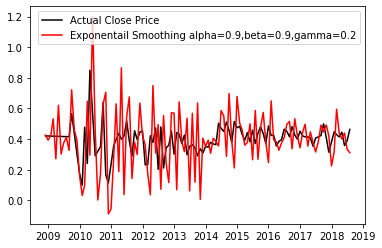

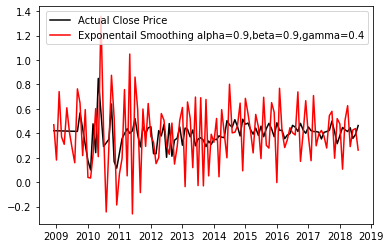

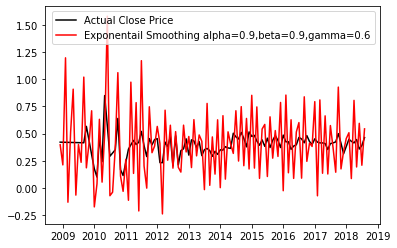

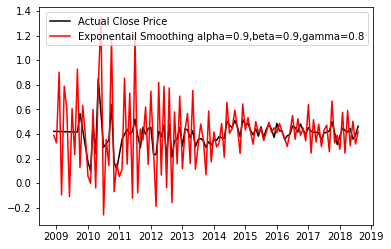

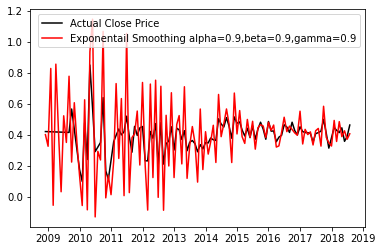

In [35]:
from statsmodels.tsa.api import ExponentialSmoothing
for alpha in [0,0.2,0.4,0.6,0.8,0.9]:
    for beta in [0,0.2,0.4,0.6,0.8,0.9]:
        for gamma in [0,0.2,0.4,0.6,0.8,0.9]:
            model = ExponentialSmoothing(pos_df,trend='add',seasonal='add').fit(smoothing_level=alpha,smoothing_trend=beta,smoothing_seasonal=gamma)
            plt.plot(pos_df,color='black',label="Actual Close Price")
            plt.plot(model.fittedvalues,color="red",label=f'Exponentail Smoothing alpha={alpha},beta={beta},gamma={gamma}')
            plt.legend()
            plt.show();

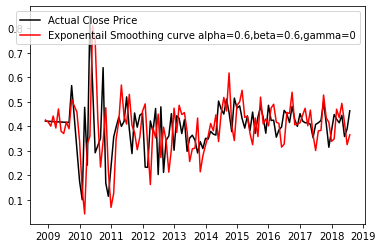

In [93]:
alpha = 0.6
beta = 0.6
gamma = 0
model = ExponentialSmoothing(pos_df,trend='add',seasonal='add').fit(smoothing_level=alpha,smoothing_trend=beta,smoothing_seasonal=gamma)
plt.plot(pos_df,color='black',label="Actual Close Price")
plt.plot(model.fittedvalues,color="red",label=f'Exponentail Smoothing curve alpha={alpha},beta={beta},gamma={gamma}')
plt.legend()
plt.show();

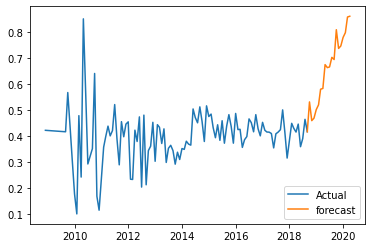

In [172]:
cd = model.forecast(20)
bx = pos_df["polarity"].append(cd[0:1])
plt.plot(bx,label="Actual")
plt.plot(cd,label="forecast")
plt.legend();

In [95]:
check_data(model.fittedvalues)

pvalue 2.7188481825384774e-10


'Data is stationary'

# plotting ACF and PACF plot

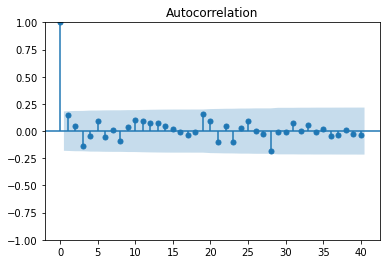

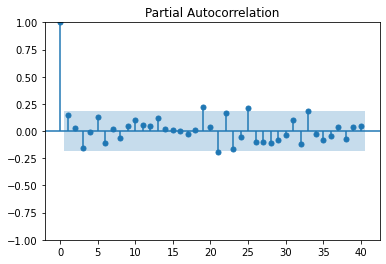

In [126]:
plot_acf(pos_df,lags=40)
plot_pacf(pos_df,lags=40);

# applying SARIMAX model

In [179]:
for p in range(1,5):
        mod = sm.tsa.statespace.SARIMAX(pos_df,order=(p,0,0),seasonal_order=None).fit()
        print("for ", p , 0, mod.aic)

for  1 0 -150.0082391669997
for  2 0 -170.91180931852475
for  3 0 -172.46142317521628
for  4 0 -179.1022326723524


In [180]:
rows = int(0.8*len(pos_df))
pos_train = pos_df[:rows]

pos_test = pos_df[rows:]

In [188]:
pos_mod = sm.tsa.statespace.SARIMAX(pos_train,order=(3,0,0),seasonal_order=(3,0,0,12)).fit()
pp_model = pos_mod.fittedvalues
print(pos_mod.summary())

                                     SARIMAX Results                                      
Dep. Variable:                           polarity   No. Observations:                   93
Model:             SARIMAX(3, 0, 0)x(3, 0, 0, 12)   Log Likelihood                  62.854
Date:                            Thu, 06 Apr 2023   AIC                           -111.709
Time:                                    11:05:16   BIC                            -93.981
Sample:                                12-01-2008   HQIC                          -104.551
                                     - 08-01-2016                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4731      0.094      5.020      0.000       0.288       0.658
ar.L2          0.3349      0.074   

In [189]:
pos_str = len(pos_train)
pos_end = len(pos_train)+(len(pos_test)-1)

# LjungBox test

In [190]:
pvalue = sm.stats.acorr_ljungbox(pos_mod.resid,lags=[1],return_df=True)['lb_pvalue'].values
print(pvalue)
if pvalue < 0.05:
    print('Reject H0.BAD MODEL')
else:
    print("FAILED to Reject H0.Good MODEL")

[0.6295175]
FAILED to Reject H0.Good MODEL


In [151]:
forcast = pos_mod.forecast(60)

In [152]:
pos_pred = pos_mod.predict(pos_str,pos_end)

In [153]:
df_sarima_res_pos = pd.DataFrame({"Predictions":pos_pred})
df_sarima_res_pos["Actual"] = pos_test
df_sarima_res_pos["err"] = df_sarima_res_pos["Actual"]-df_sarima_res_pos["Predictions"]

df_sarima_res_pos

,Predictions,Actual,err
2016-09-01,0.438912,0.415700,-0.023212
2016-10-01,0.436693,0.481607,0.044913
2016-11-01,0.420796,0.427236,0.006440
2016-12-01,0.423784,0.400115,-0.023670
2017-01-01,0.414811,0.452038,0.037226
2017-02-01,0.408191,0.421520,0.013329
2017-03-01,0.397110,0.414862,0.017752
2017-04-01,0.387579,0.414335,0.026756
2017-05-01,0.385584,0.409021,0.023437
2017-06-01,0.370676,0.353813,-0.016864


In [154]:
pos_pp = pos_train["polarity"].append(pos_pred[0:1])

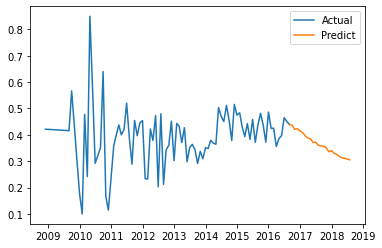

In [155]:
plt.plot(pos_pp,label="Actual")
plt.plot(pos_pred,label="Predict")
plt.legend();

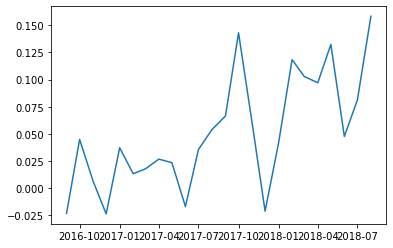

In [156]:
plt.plot(df_sarima_res_pos["err"])

In [56]:
from sklearn.metrics import mean_squared_error
pos_mse = mean_squared_error(pos_pred,pos_test)
print("Positive mse",pos_mse)
print("Positive rmse",np.sqrt(pos_mse))

Positive mse 0.0021781214203527286
Positive rmse 0.046670348406163936


#    NEGATIVE SENTIMENT TIME SERIES ANALYSIS

In [57]:
neg_df=negative[['polarity']]
neg_df

,polarity
reviewTime,
2018-03-25,-0.022222
2017-09-10,-0.100000
2017-08-22,-0.013393
2017-07-06,-0.112500
2017-05-04,-0.500000
...,...
2017-04-11,-0.300000
2017-11-22,-0.114583
2017-05-10,-0.350000


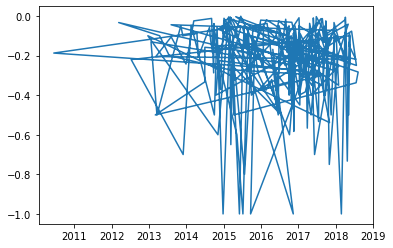

In [58]:
plt.plot(neg_df);

In [59]:
neg_df= neg_df.resample('MS').mean()
neg_df.isnull().sum()

polarity    33
dtype: int64

In [60]:
neg_df["polarity"] = neg_df["polarity"].interpolate(option='spline')
neg_df.isnull().sum()

polarity    0
dtype: int64

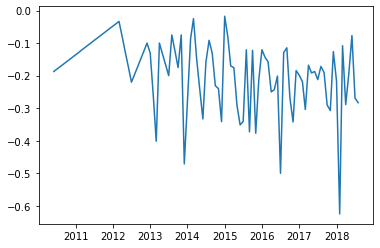

In [61]:
plt.plot(neg_df);


In [62]:
check_data(neg_df)  #checking stationary of data

pvalue 1.291608629943252e-12


'Data is stationary'

In [63]:
# Decomposition plot for predicted data using Features
decomposition_p=seasonal_decompose((neg_df), period=12)
trend=decomposition_p.trend
seasonal=decomposition_p.seasonal
residual=decomposition_p.resid

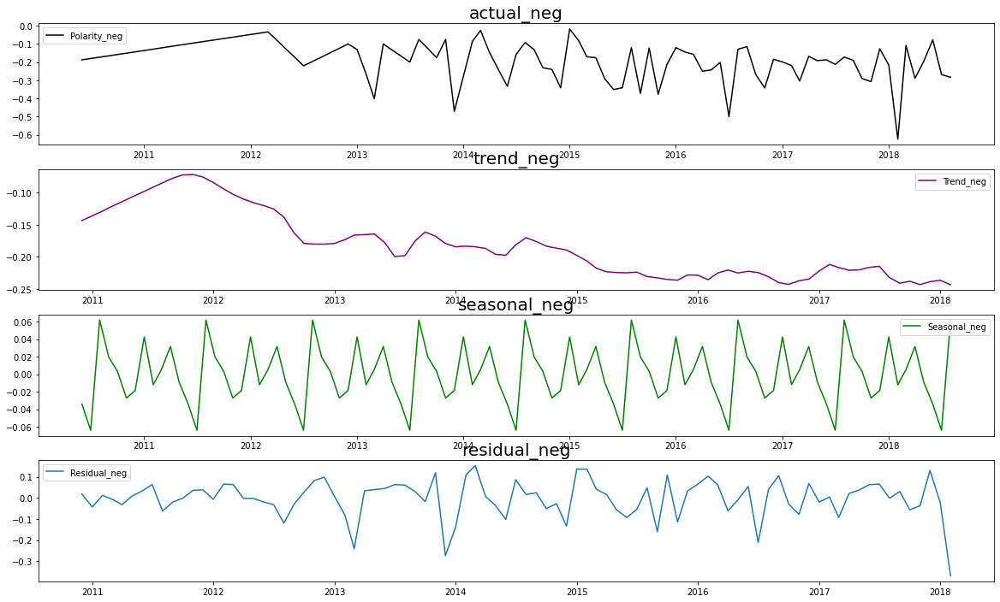

In [64]:
ig,ax = plt.subplots(4,1,figsize=(20,12))

plt.subplot(411)
plt.plot(neg_df,label='Polarity_neg',c='black')
plt.legend()
plt.title('actual_neg', fontsize = 20)

plt.subplot(412)
plt.plot(trend,label='Trend_neg',c='purple')
plt.legend()
plt.title('trend_neg', fontsize = 20)

plt.subplot(413)
plt.plot(seasonal,label='Seasonal_neg',c='green')
plt.legend()
plt.title('seasonal_neg', fontsize = 20)

plt.subplot(414)
plt.plot(residual,label='Residual_neg')
plt.legend()
plt.title('residual_neg', fontsize = 20)
plt.show()

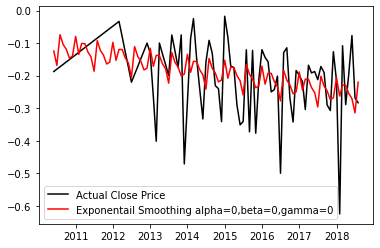

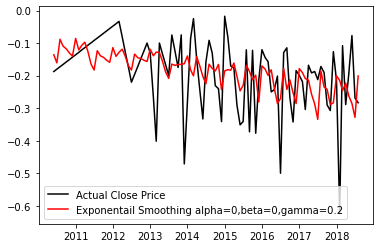

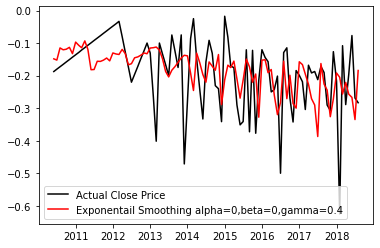

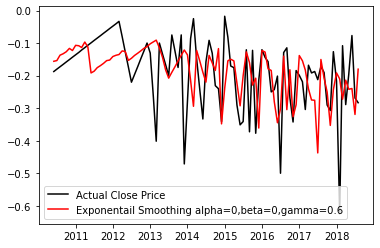

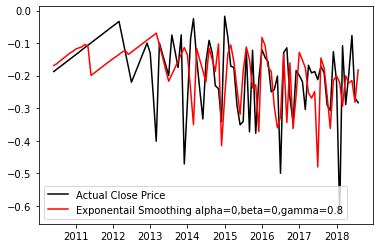

...

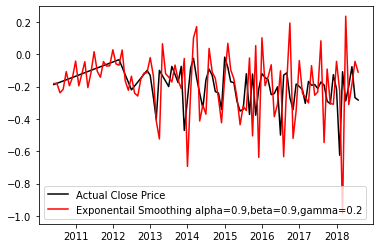

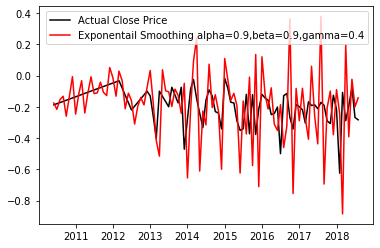

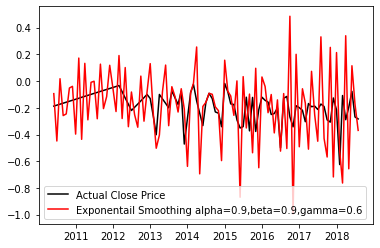

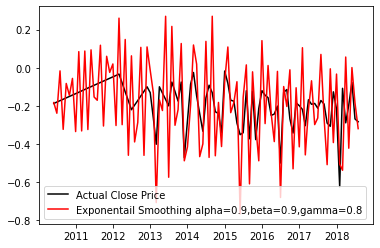

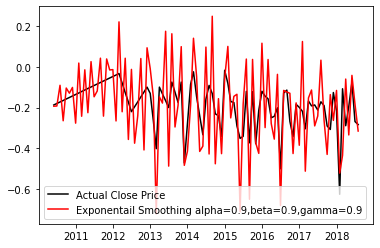

In [65]:
for alpha in [0,0.2,0.4,0.6,0.8,0.9]:
    for beta in [0,0.2,0.4,0.6,0.8,0.9]:
        for gamma in [0,0.2,0.4,0.6,0.8,0.9]:
            model = ExponentialSmoothing(neg_df,trend='add',seasonal='add').fit(smoothing_level=alpha,smoothing_trend=beta,smoothing_seasonal=gamma)
            plt.plot(neg_df,color='black',label="Actual Close Price")
            plt.plot(model.fittedvalues,color="red",label=f'Exponentail Smoothing alpha={alpha},beta={beta},gamma={gamma}')
            plt.legend()
            plt.show();

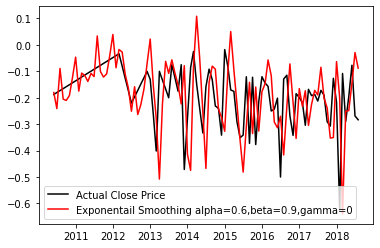

In [68]:
alpha = 0.6
bete = 0.2
gamma = 0
model = ExponentialSmoothing(neg_df,trend='add',seasonal='add').fit(smoothing_level=alpha,smoothing_trend=beta,smoothing_seasonal=gamma)
plt.plot(neg_df,color='black',label="Actual Close Price")
plt.plot(model.fittedvalues,color="red",label=f'Exponentail Smoothing alpha={alpha},beta={beta},gamma={gamma}')
plt.legend()
plt.show();

In [69]:
sx = model.forecast(60)
dd = neg_df["polarity"].append(sx[0:1])

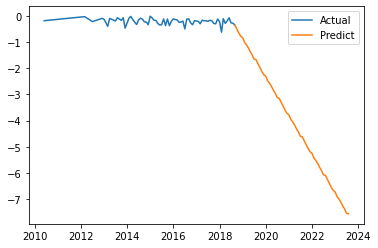

In [70]:
plt.plot(dd,label="Actual")
plt.plot(sx,label="Predict")
plt.legend();

In [71]:
check_data(model.fittedvalues)

pvalue 7.822195950237137e-10


'Data is stationary'

# Plotting ACF and PACF graph

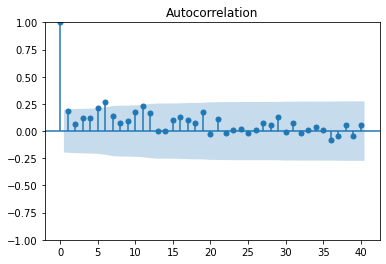

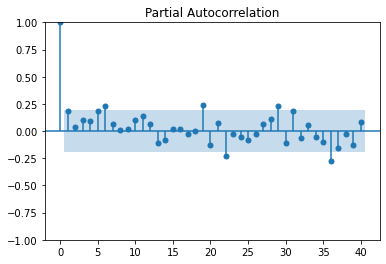

In [157]:
plot_acf(neg_df,lags=40)
plot_pacf(neg_df,lags=40);

In [175]:
for q in range(1,2):
    for p in range(1,6):
        mod = sm.tsa.statespace.SARIMAX(neg_df,order=(p,0,q),seasonal_order=None).fit()
        print("for ", p , q, mod.aic)

for  1 1 -163.69852960709022
for  2 1 -161.7626142555766
for  3 1 -160.96211467833882
for  4 1 -159.43939667675133
for  5 1 -158.3499094988652


In [158]:
n_num = int(0.8*len(neg_df))
neg_train = neg_df[:n_num]
neg_test = neg_df[n_num:]

In [160]:
negs_mod = sm.tsa.statespace.SARIMAX(neg_train,order=(5,0,1),seasonal_order=(5,0,1,12)).fit()
nn_model = negs_mod.fittedvalues
print(negs_mod.summary())

                                     SARIMAX Results                                      
Dep. Variable:                           polarity   No. Observations:                   79
Model:             SARIMAX(5, 0, 1)x(5, 0, 1, 12)   Log Likelihood                  72.082
Date:                            Thu, 06 Apr 2023   AIC                           -118.164
Time:                                    10:38:09   BIC                            -87.361
Sample:                                06-01-2010   HQIC                          -105.823
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8282      0.264      3.139      0.002       0.311       1.345
ar.L2         -0.1306      0.181   

# LjungBOX yest

In [161]:
pvalue = sm.stats.acorr_ljungbox(negs_mod.resid,lags=[1],return_df=True)['lb_pvalue'].values
print(pvalue)
if pvalue < 0.05:
    print('Reject H0.BAD MODEL')
else:
    print("FAILED to Reject H0.Good MODEL")

[0.85648459]
FAILED to Reject H0.Good MODEL


In [162]:
nn_str = len(neg_train)
nn_end = len(neg_train)+len(neg_test)-1

In [163]:
ng_pred = negs_mod.forecast(60)

In [164]:
nn_pred = negs_mod.predict(nn_str,nn_end)
nnd = neg_train["polarity"].append(nn_pred[0:1])

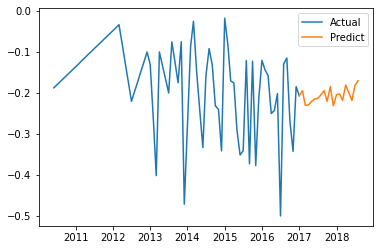

In [165]:
plt.plot(nnd,label="Actual")
plt.plot(nn_pred,label="Predict")
plt.legend();

In [166]:
ndf_sarima_res = pd.DataFrame({"Predictions":nn_pred})
ndf_sarima_res["Actual"] = neg_test
ndf_sarima_res["err"] = ndf_sarima_res["Actual"]-ndf_sarima_res["Predictions"]

ndf_sarima_res

,Predictions,Actual,err
2017-01-01,-0.206875,-0.199096,0.007779
2017-02-01,-0.194639,-0.218874,-0.024235
2017-03-01,-0.230254,-0.304167,-0.073913
2017-04-01,-0.229164,-0.168087,0.061077
2017-05-01,-0.220709,-0.191852,0.028857
2017-06-01,-0.214579,-0.187384,0.027194
2017-07-01,-0.213106,-0.212401,0.000706
2017-08-01,-0.204780,-0.171916,0.032864
2017-09-01,-0.194405,-0.190583,0.003821
2017-10-01,-0.220546,-0.290390,-0.069843


In [167]:
neg_mse = mean_squared_error(nn_pred,neg_test)
print("Negative mse",neg_mse)
print("Negative rmse",np.sqrt(neg_mse))

Negative mse 0.014314686533901819
Negative rmse 0.11964399915541865


In [168]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.graph_objects as go
from plotly.offline import plot

# line chart to visualize the trend of forcasting postive reviews for the "musical instrument" dataset.

In [169]:
x = pos_pp.index
y = pos_pp.values
trace1 = go.Scatter(x=x,y=y,name="Pervious Trend of Positive Reviews")
x1 = forcast.index
y1 = forcast.values
trace2 = go.Scatter(x=x1,y=y1,name="Forecasted Trend of Positive Reviews")

data = [trace1,trace2]
layout = go.Layout(title = "Musical Instrument data",yaxis=dict(title="Polarity score",zeroline=True,showline=True),
                  xaxis = dict(title = "Year"))

fig = go.Figure(data=data,layout=layout)

fig.show()

# line chart to visualize the trend of forcasting negative reviews for the "musical instrument" dataset.

In [170]:
x = nnd.index
y = nnd.values
trace1 = go.Scatter(x=x,y=y,name="Pervious trend of Negative Reviews")
x1 = ng_pred.index
y1 = ng_pred.values
trace2 = go.Scatter(x=x1,y=y1,name="Forecasted Future trend of Negative Reviews")

data = [trace1,trace2]
layout = go.Layout(title = "Musical Instrument Data",yaxis=dict(title="Polarity Score",zeroline=True,showline=True),
                  xaxis = dict(title = "Year"))

fig = go.Figure(data=data,layout=layout)

fig.show()

# overal sentiment forcast graph

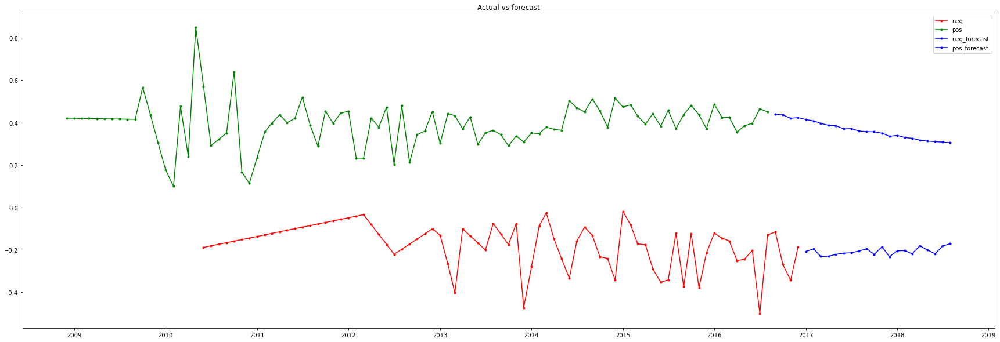

In [171]:
plt.figure(figsize=(30,10))
plt.title('Actual vs forecast')
plt.plot(neg_train["polarity"],marker = '.', label = 'neg', color = 'red')
plt.plot(pos_train["polarity"],marker = '.', label = 'pos', color = 'g')
plt.plot(nn_pred,marker = '.', label = 'neg_forecast', color = 'b')
plt.plot(pos_pred,marker = '.', label = 'pos_forecast', color = 'b')
plt.legend()

# conclusion:
    the positive reviews are constant  over the period but the negative reviews are decreasing  in more percent compare to postive review.